In [1]:
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import lmfit 

from math import factorial

import matplotlib.pyplot as plt

from scipy import optimize

from kineticanalysis.generator.generator_track import (generate_tracks,
                                                        generate_one_track,
                                                        generate_profile)
from kineticanalysis.analysis.analysis_track import (autocorrelation,
                                                    single_track_analysis)
from kineticanalysis.analysis.fit_functions import (function_approx, function_exact, function_epitope)

In [5]:
def generate_one_track(prot_length,
                       suntag_length,
                       nb_suntag,
                       fluo_one_suntag,
                       translation_rate,
                       binding_rate,
                       retention_time=0,
                       suntag_pos="begin",
                       noise=False,
                       noise_std=0,
                       step=0.1,
                       length=6000,
                       ):
    x, y = generate_profile(prot_length,
                            suntag_length,
                            nb_suntag,
                            fluo_one_suntag,
                            translation_rate,
                            retention_time,
                            suntag_pos,
                            step,
                            noise,
                            noise_std
                            )

    # global signal
    x_global = np.arange(length, step=step)
    y_global = np.zeros(len(x_global))
    y_start_prot = np.zeros(len(x_global))

    n_rand = np.random.rand(len(x_global))
    for i in range(len(x_global)):
        # random number between 0 and 1
        if n_rand[i] < (binding_rate * step):
            if i > (len(x_global) - len(x)):
                y_global[i:i + len(x)] += y[:len(y_global[i:i + len(x)])]
                y_start_prot[i:i + len(x)] += 1
            else:
                y_global[i:i + len(x)] += y
                y_start_prot[i:i + len(x)] += 1

    # Remove the first time points
    # x_global = x_global[2000:] - 200  # -200 to start time at 0
    # y_global = y_global[2000:]
    # y_start_prot = y_start_prot[2000:]

    return x_global, y_global, y_start_prot


def autocorrelation_manual(intensity, lags):
    I = np.array(intensity, dtype=float)
    N = len(I)

    # Mean intensity
    I_mean = np.mean(I)
    delta_I = I - I_mean

    # Compute autocorrelation via FFT (efficient method)
    # Pad to 2N for no circular overlap
    f = np.fft.fft(delta_I, n=2*N)
    ac = np.fft.ifft(f * np.conjugate(f))[:N].real

    # Normalize
    ac /= np.arange(N, 0, -1)   # correct for reduced pairs at long τ
    G = ac / (I_mean ** 2)

    # Lag times
    tau = np.arange(N)

    return tau, G

def fit_function_post(x, k, c, M):
    return (((M/k) - x) / (c * (M/k) ** 2)) * np.heaviside(((M/k) - x), 0)

    
def fit_function_stem_loop(x, k, c, N):
    return (k/c)*(2/3)*(1/((N*(N+1))**2)) * np.exp(-k*x) * (
        sum((N-n)*(N-n+1)*((2*N)+n+1)*(((k*x)**n)/(np.float128(factorial(n)))) for n in range (0, int(N)))
    )
    
# def fit_function_exact_v2(x, k, c, N):
#     sum_ = []
#     for n in range (0, int(N), 1):
#         sum_.append((N-n)*(N-n+1)*((2*N)+n+1)*(((k*x)**n)/factorial(n)))
#     return (k/c)*(2/3)*(1/((N*(N+1))**2)) * np.exp(-k*x) * np.sum(sum_, axis=0)
    

from math import isnan
def fit_function_exact_v3(x, k, c, N, M):
    denominator= (c/k)**2*((N*(N+1))/2 + N*M)**2
       
    part1 = c/k*np.exp(-k*x) * sum((N-n)*(N-n+1)*(((2*N)+n+1)/6)*(((k*x)**n)/np.float128(factorial(n))) for n in range (0, int(N))) /denominator
    
    part2 = c/k*np.exp(-k*x) * N * sum(n * ((2*N-n+1)/2) * ((k*x)**n)/(np.float128(factorial(int(n)))) for n in range (0, int(N))) /denominator
    part3 = c/k*np.exp(-k*x) * (N**2) * ((N+1)/2) * sum(((k*x)**n)/(np.float128(factorial(int(n)))) for n in range (int(N), int(M))) /denominator
    part4 = c/k*np.exp(-k*x) * N * sum(n *( (1+n)/2) * (((k*x)**(M+N-n))/(np.float128(factorial(int(M+N-n))))) for n in range (1, int(N))) /denominator
    
    part5 = c/k*np.exp(-k*x) * (N**2) * sum((M-n)*(((k*x)**n)/(np.float128(factorial(int(n))))) for n in range (0, int(M))) /denominator

    # out = part1+part5
    out = part1+part2+part3+part4+part5
    # out[out==np.inf] = 0
    # out = [0 if isnan(i) else i for i in out ] 
    return out


In [127]:
suntag_length = 796
prot_length =  500
nb_suntag = 32
fluo_one_suntag = 4
translation_rate = 15
binding_rate = 0.33
step = 0.1
length = 6000


x_global, y_global, y_start = generate_one_track(prot_length=prot_length,
                                                   suntag_length=suntag_length,
                                                   nb_suntag=nb_suntag,
                                                   fluo_one_suntag=fluo_one_suntag,
                                                   translation_rate=translation_rate,
                                                   binding_rate=binding_rate,
                                                   step=step,
                                                   length=length)

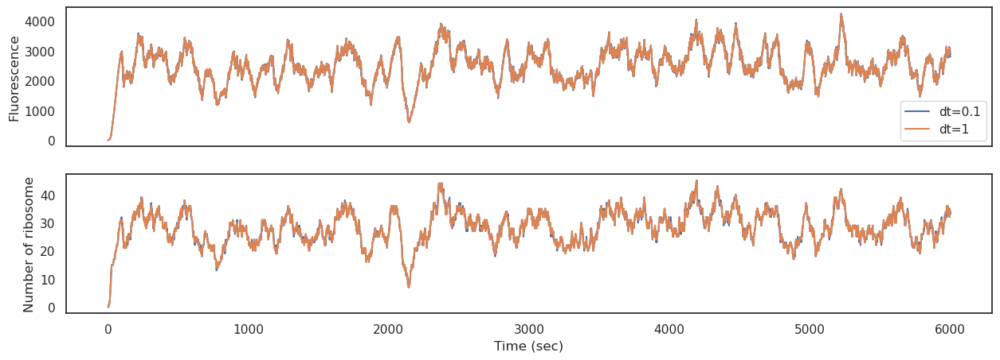

In [130]:
fig, axes = plt.subplots(nrows = 2, sharex=True)
max_ = 60000 # nb_point
step_ = 1
axes[0].plot(x_global[::step_][:max_], y_global[::step_][:max_], label="dt=0.1")
axes[1].plot(x_global[::step_][:max_], y_start[::step_][:max_])

max_ = 6000  # nb point
step_ = 10
axes[0].plot(x_global[::step_][:max_], y_global[::step_][:max_], label="dt=1")
axes[1].plot(x_global[::step_][:max_], y_start[::step_][:max_])

axes[0].legend()
axes[0].set_ylabel("Fluorescence")
axes[1].set_ylabel("Number of ribosome")
axes[1].set_xlabel("Time (sec)")

fig.set_size_inches((15,5))

/tmp/ipykernel_1223104/3163778380.py:66: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  datas = pd.concat([datas,
/tmp/ipykernel_1223104/3163778380.py:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig2, axes2 = plt.subplots(nrows=3)


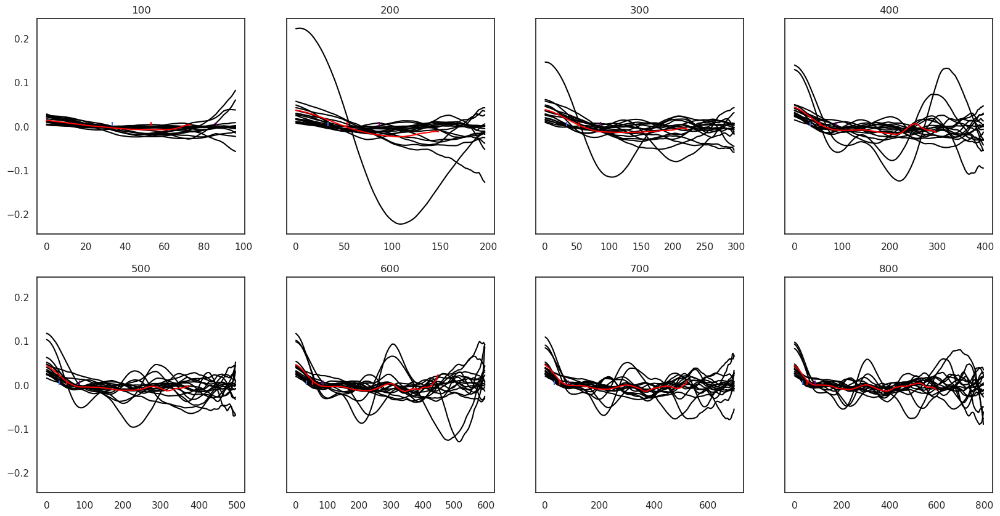

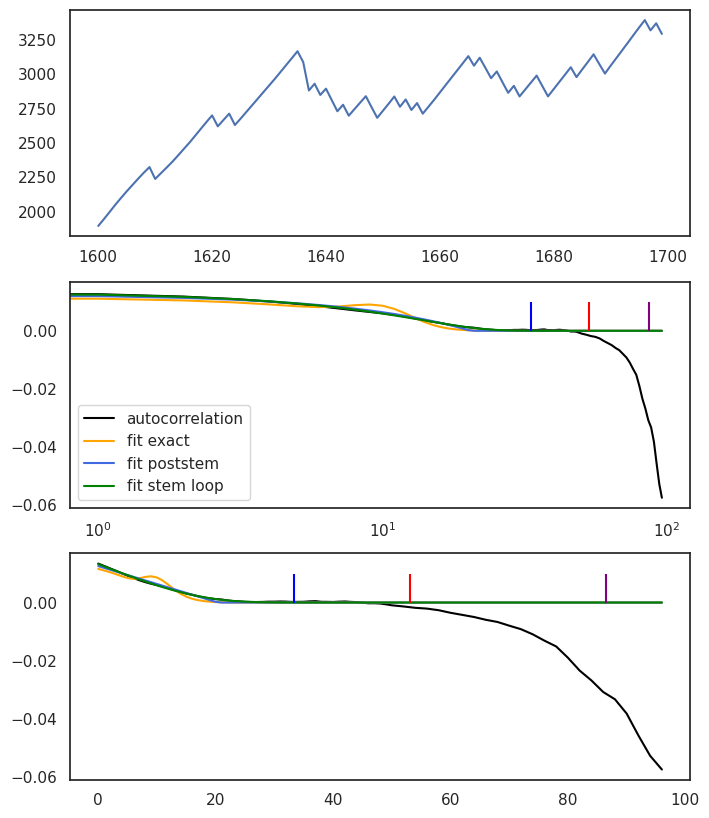

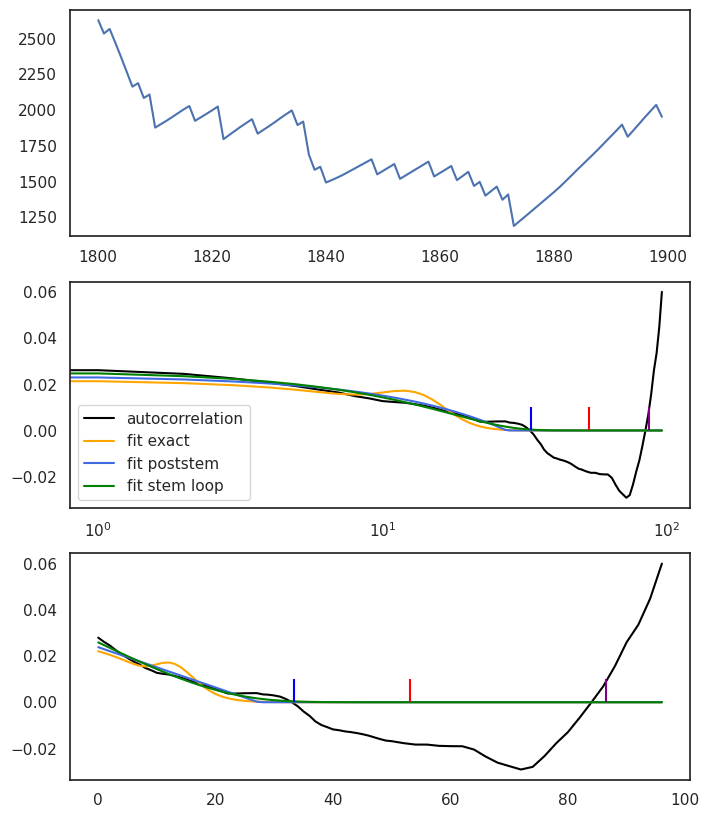

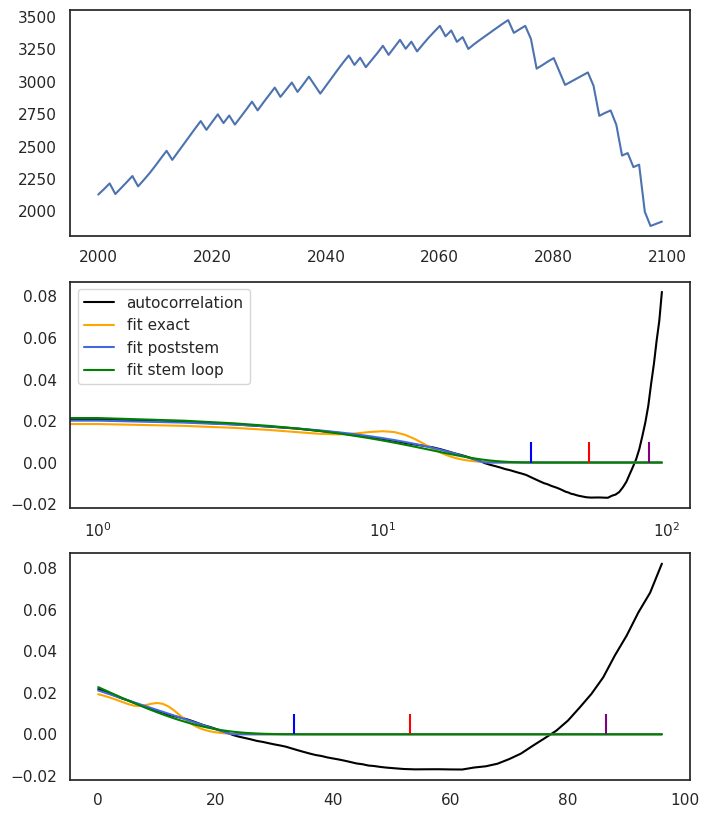

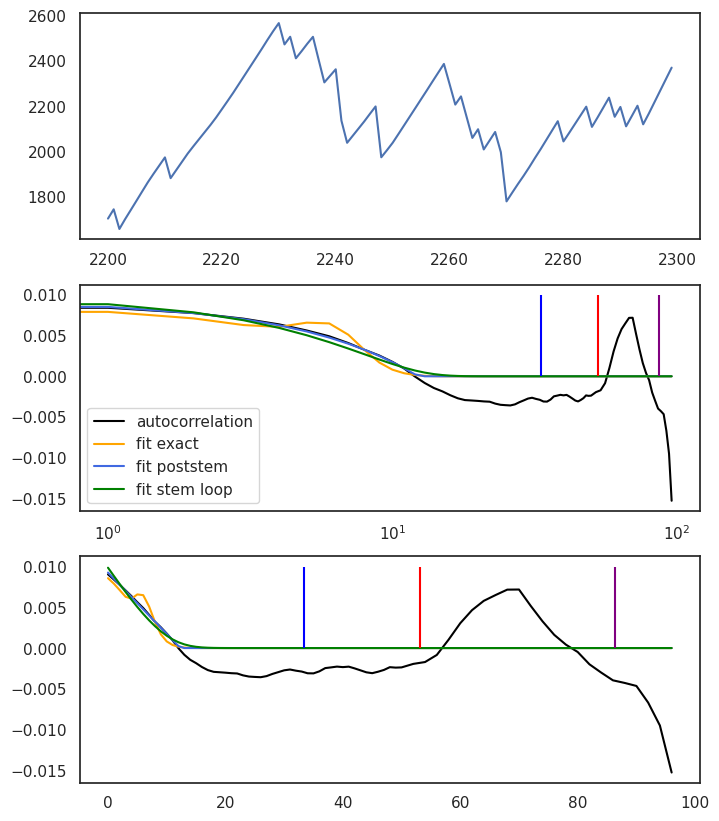

...

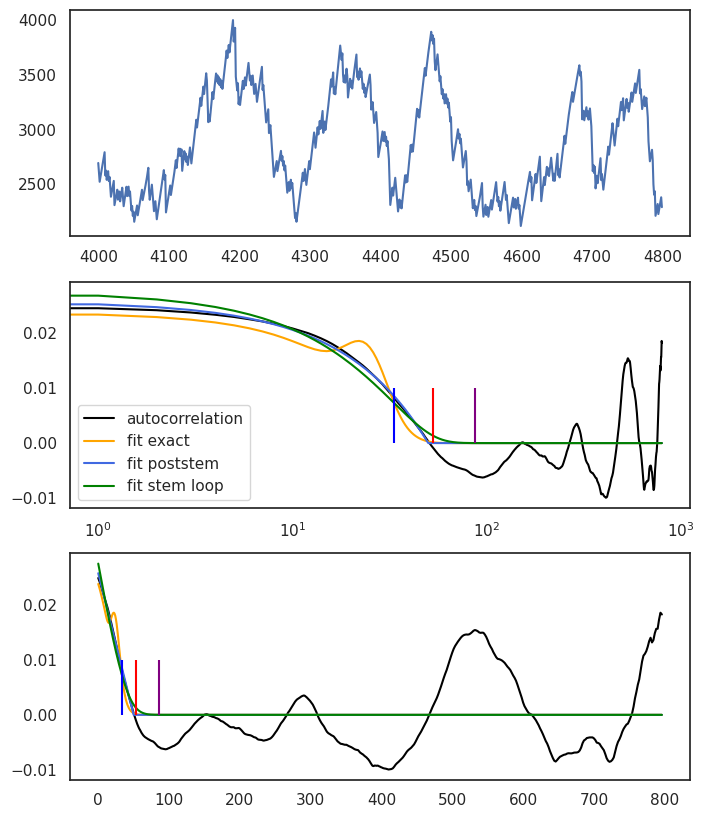

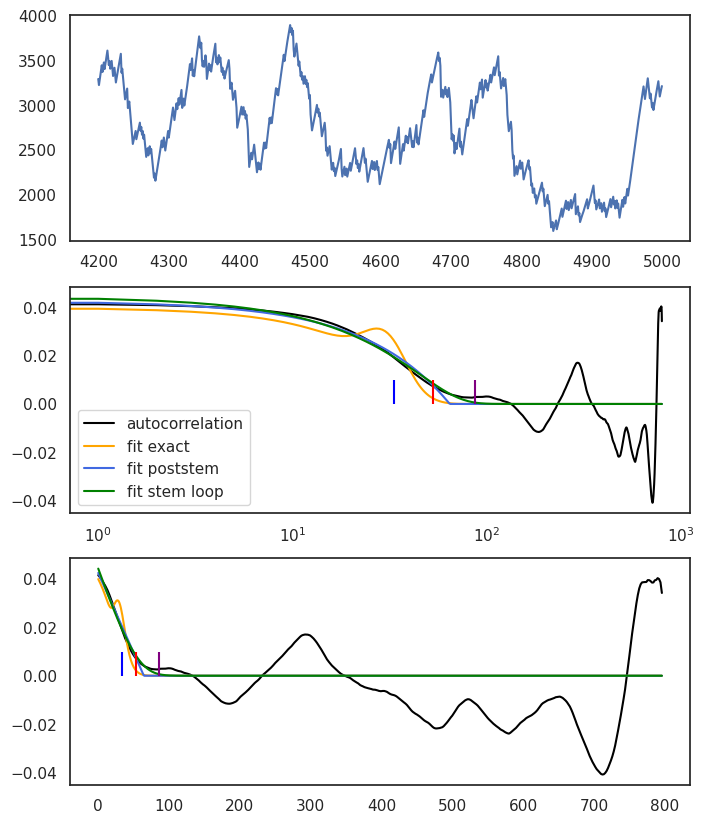

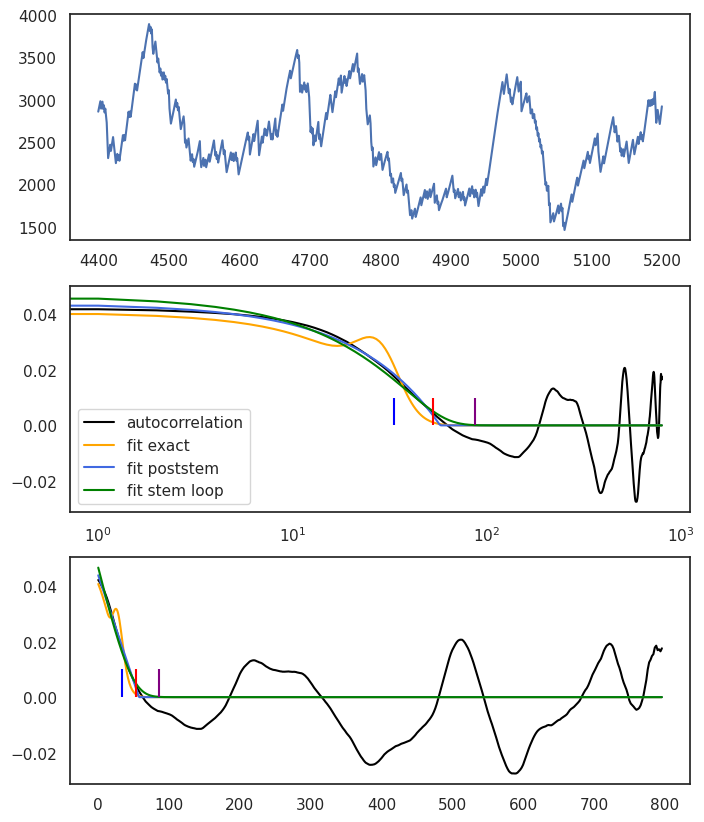

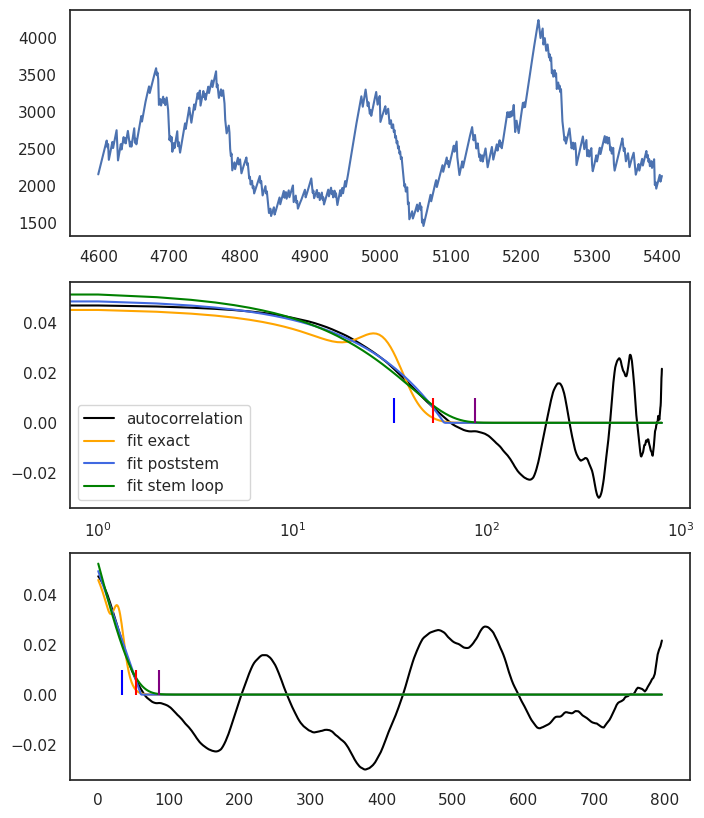

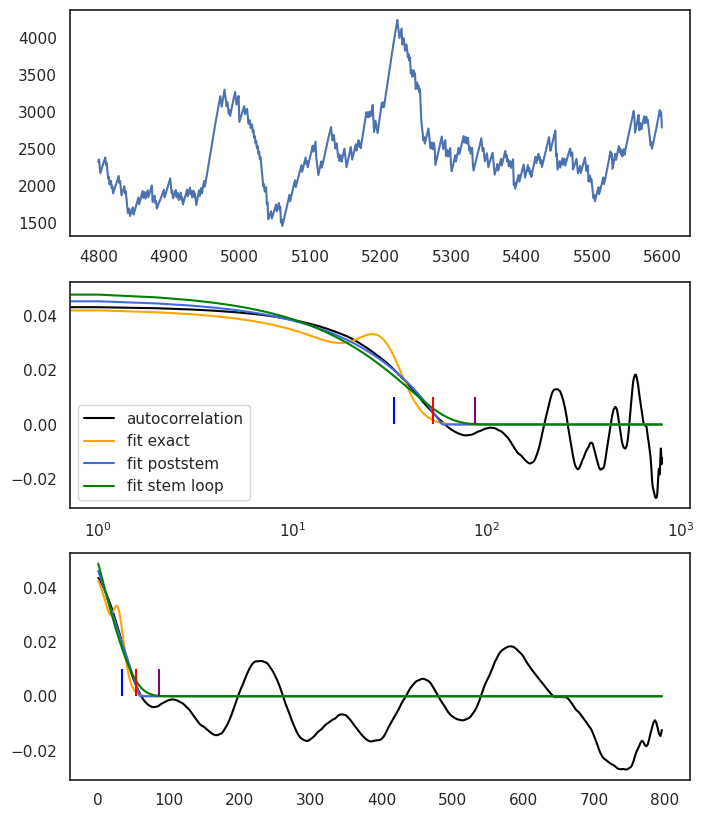

In [133]:
mins = np.arange(1600, 5000, 200)

datas = pd.DataFrame(columns=["start", "end","length", "k_exact", "c_exact", "k_stem", "c_stem", "k_post", "c_post"])

fig, axes = plt.subplots(nrows = 2, ncols = 4, sharey=True)

i=0
j=0

for length in [100, 200, 300, 400, 500, 600, 700, 800]:
    if j == 4:
        i+=1
        j=0
    maxs = mins+length
    step = 10
    # fig, ax = plt.subplots()
    means_values =[]
    for min_i, max_i in zip(mins, maxs):
        
        x_auto, y_auto = autocorrelation(y_global[::step][min_i:max_i], np.nan)
        
        x_auto, y_auto = autocorrelation(y_global[::step][min_i:max_i], 
                                        delta_t=1.)
        means_values.append(y_auto)

        # y_auto -= np.min(y_auto)
    
        
        # analysis exact equation
        model = lmfit.Model(fit_function_exact_v3)
        params = lmfit.Parameters() 
        params.add('N', value=32, vary=False)
        params.add('M', value=int(prot_length/(int(suntag_length/nb_suntag))), vary=False)
        params.add('k', value=np.float128(0.6), min=0)
        params.add('c', value=np.float128(0.1), min=0)
        
        result_exact = model.fit(y_auto, params, x=np.arange(0,len(y_auto)), nan_policy='raise')
        # print(result_exact.params["c"].value, result.params["k"].value)
        # print(result_exact.params["k"].value/y_auto[0],)

        # analysis stem loop equation
        model = lmfit.Model(fit_function_stem_loop)
        params = lmfit.Parameters() 
        params.add('N', value=32, vary=False)
        params.add('k', value=np.float128(0.6), min=0)
        params.add('c', value=np.float128(0.1), min=0)
        
        result_stem = model.fit(y_auto, params, x=np.arange(0,len(y_auto)),nan_policy='raise')
        # print(result_post.params["c"].value, result.params["k"].value)
        # print(result_post.params["k"].value/y_auto[0],)
        
        # print(result.params["k"], result.params["c"])

        # analysis post stem loop equation
        # approx_k, approx_c, perr=fit_autocorrelation_approx(x_auto, y_auto, func_= ; protein_size= suntag_length+prot_length)

        # analysis stem loop equation
        model = lmfit.Model(fit_function_post)
        params = lmfit.Parameters() 
        params.add('M', value=int(prot_length/(int(suntag_length/nb_suntag))), vary=False)
        params.add('k', value=np.float128(0.6), min=0)
        params.add('c', value=np.float128(0.1), min=0)
        
        result_post = model.fit(y_auto, params, x=np.arange(0,len(y_auto)),nan_policy='raise')
    
        datas = pd.concat([datas,
                             pd.DataFrame(
                                 {"start": min_i,
                                  "end":max_i, 
                                  "length":length,
                                  "k_exact":result_exact.params["k"].value, 
                                  "c_exact": result_exact.params["c"].value,
                                  "k_stem":result_stem.params["k"].value, 
                                  "c_stem": result_stem.params["c"].value,
                                  "k_post":result_post.params["k"].value,  
                                  "c_post": result_post.params["c"].value}, index=[0])
                             ], ignore_index=True)

        axes[i,j].plot(x_auto, y_auto, c="black", label="autocorrelation")

        
        fig2, axes2 = plt.subplots(nrows=3)
        axes2[0].plot(x_global[::step][min_i:max_i], 
                 y_global[::step][min_i:max_i])
        axes2[1].plot(x_auto, y_auto, c="black", label="autocorrelation")
        axes2[1].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N, int(prot_length/(int(suntag_length/nb_suntag)))), label = "fit exact", color="orange")
        axes2[1].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag)))), label = "fit poststem", color="royalblue")
        axes2[1].plot(x_auto, fit_function_stem_loop(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N), label = "fit stem loop", color="green")
        axes2[2].plot(x_auto, y_auto, c="black", label="autocorrelation")
        axes2[2].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N, int(prot_length/(int(suntag_length/nb_suntag)))), label = "fit exact", color="orange")
        axes2[2].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag)))), label = "fit poststem", color="royalblue")
        axes2[2].plot(x_auto, fit_function_stem_loop(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N), label = "fit stem loop", color="green")

        axes2[1].vlines((suntag_length+prot_length)/translation_rate, 0,0.01,color='purple')
        axes2[1].vlines((suntag_length)/translation_rate, 0,0.01,color='red')
        axes2[1].vlines((prot_length)/translation_rate, 0,0.01, color='blue')
        axes2[2].vlines((suntag_length+prot_length)/translation_rate, 0,0.01, color="purple")
        axes2[2].vlines((suntag_length)/translation_rate, 0,0.01, color="red")
        axes2[2].vlines((prot_length)/translation_rate, 0,0.01, color="blue")
        
        axes2[1].set_xscale("log")
        axes2[1].legend()
        fig2.set_size_inches((8,10))
        fig2.savefig(str(min_i)+str(max_i)+".png")
    
        # fig, axes = plt.subplots(nrows=3)
    
        # axes[0].plot(x_global[::step][min_i:max_i], 
        #          y_global[::step][min_i:max_i])
        
        # axes[1].plot(x_auto, y_auto, c="black", label="autocorrelation")
        # # axes[1].plot(x_auto, fit_function_exact(x_auto, result.params["k"].value, result.params["c"].value, result.params["N"].value), label = "fit exact")
        # axes[1].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N,int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit exact", color='purple')
        # axes[1].plot(x_auto, fit_function_exact(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N,)[:int(len(x_auto))], label = "fit stem", color="red")
        # axes[1].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit post", color="royalblue")
        
        # # axes[1].plot(x_auto, fit_function_exact_v3(x_auto, 24*translation_rate, 1/0.15, N, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "Exact")
        
        # axes[2].plot(x_auto, y_auto, c="black", label="autocorrelation")
        # # axes[2].plot(x_auto, fit_function_exact(x_auto, result.params["k"].value, result.params["c"].value, result.params["N"].value), label = "fit exact")
        # axes[2].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit exact", color="purple")
        # axes[2].plot(x_auto, fit_function_exact(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N,)[:int(len(x_auto))], label = "fit stem", color="red")
        # axes[2].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit post", color="royalblue")
        
        
        # axes[1].vlines((suntag_length+prot_length)/translation_rate, 0,0.01,color='purple')
        # axes[1].vlines((suntag_length)/translation_rate, 0,0.01,color='red')
        # axes[1].vlines((prot_length)/translation_rate, 0,0.01, color='royalblue')
        # axes[2].vlines((suntag_length+prot_length)/translation_rate, 0,0.01, color="purple")
        # axes[2].vlines((suntag_length)/translation_rate, 0,0.01, color="red")
        # axes[2].vlines((prot_length)/translation_rate, 0,0.01, color="royalblue")
        
        # axes[2].set_xlim(-2, 2*(suntag_length+prot_length)/translation_rate,)
        # axes[0].set_title(str(length))
        # axes[1].set_xscale("log")
        # # ax.set_yscale("log")
        # axes[1].legend()
        # fig.set_size_inches((8,10))
    axes[i,j].plot(np.mean(means_values, axis=0), color="red")

    # analysis for the means 
    model = lmfit.Model(fit_function_exact_v3)
    params = lmfit.Parameters() 
    params.add('N', value=32, vary=False)
    params.add('M', value=int(prot_length/(int(suntag_length/nb_suntag))), vary=False)
    params.add('k', value=np.float128(0.6), min=0)
    params.add('c', value=np.float128(0.1), min=0)
    
    result_exact = model.fit(np.mean(means_values, axis=0), params, x=np.arange(0,len(np.mean(means_values, axis=0))), nan_policy='raise')
    # print(result_exact.params["c"].value, result.params["k"].value)
    # print(result_exact.params["k"].value/y_auto[0],)

    # analysis stem loop equation
    model = lmfit.Model(fit_function_stem_loop)
    params = lmfit.Parameters() 
    params.add('N', value=32, vary=False)
    params.add('k', value=np.float128(0.6), min=0)
    params.add('c', value=np.float128(0.1), min=0)
    
    result_stem = model.fit(np.mean(means_values, axis=0), params, x=np.arange(0,len(np.mean(means_values, axis=0))),nan_policy='raise')
    # print(result_post.params["c"].value, result.params["k"].value)
    # print(result_post.params["k"].value/y_auto[0],)
    
    # print(result.params["k"], result.params["c"])

    # analysis post stem loop equation
    # approx_k, approx_c, perr=fit_autocorrelation_approx(x_auto, y_auto, func_= ; protein_size= suntag_length+prot_length)

    # analysis stem loop equation
    model = lmfit.Model(fit_function_post)
    params = lmfit.Parameters() 
    params.add('M', value=int(prot_length/(int(suntag_length/nb_suntag))), vary=False)
    params.add('k', value=np.float128(0.6), min=0)
    params.add('c', value=np.float128(0.1), min=0)
    
    result_post = model.fit(np.mean(means_values, axis=0), params, x=np.arange(0,len(np.mean(means_values, axis=0))),nan_policy='raise')

    datas = pd.concat([datas,
                         pd.DataFrame(
                             {"start": -10,
                              "end":-10, 
                              "length":length,
                              "k_exact":result_exact.params["k"].value, 
                              "c_exact": result_exact.params["c"].value,
                              "k_stem":result_stem.params["k"].value, 
                              "c_stem": result_stem.params["c"].value,
                              "k_post":result_post.params["k"].value,  
                              "c_post": result_post.params["c"].value}, index=[0])
                         ], ignore_index=True)    

    axes[i,j].vlines((suntag_length+prot_length)/translation_rate, 0,0.01,color='purple')
    axes[i,j].vlines((suntag_length)/translation_rate, 0,0.01,color='red')
    axes[i,j].vlines((prot_length)/translation_rate, 0,0.01, color='royalblue')
    axes[i,j].set_title(str(length))
    j+=1
    
fig.set_size_inches((20,10))

In [134]:
one_loop_size = 24

# datas["k_exact_calculated"] = one_loop_size/(1/(datas["k_exact"]))
datas["k_exact_calculated"] = datas["k_exact"]*one_loop_size 

datas["k_stem_calculated"] = datas["k_stem"]*one_loop_size  # ok

datas["k_post_calculated"] = int(prot_length/(int(suntag_length/nb_suntag)))*datas["k_post"]  #ok

N=32
# datas["full_dwelltime"] = N/datas["k_exact_calculated"]
# datas["k_full_calculated"] = (suntag_length/one_loop_size)/(1/datas["k_full"])

In [135]:
datas.agg(["mean", "std"])

,start,end,length,k_exact,c_exact,k_stem,c_stem,k_post,c_post,k_exact_calculated,k_stem_calculated,k_post_calculated
mean,3021.666667,3446.666667,450.000000,1.116150,2.011946,0.602149,1.547787,0.441863,1.475591,26.787603,0.025090,8.837253
std,1207.242712,1292.558584,229.928539,0.682203,4.657254,0.383908,3.604431,0.280394,3.454635,16.372880,0.015996,5.607877


In [136]:
datas.groupby("length").agg(["mean", "std"])

start                       end                k_exact  \
               mean          std         mean          std      mean   
length                                                                 
100     3021.666667  1237.921645  3116.111111  1252.466456  2.342017   
200     3021.666667  1237.921645  3210.555556  1267.282745  1.320002   
300     3021.666667  1237.921645       3305.0  1282.361104  1.036577   
400     3021.666667  1237.921645  3399.444444  1297.692396  0.941823   
500     3021.666667  1237.921645  3493.888889  1313.267765  0.858537   
600     3021.666667  1237.921645  3588.333333  1329.078628  0.843901   
700     3021.666667  1237.921645  3682.777778  1345.116682  0.793669   
800     3021.666667  1237.921645  3777.222222  1361.373898  0.792675   

                   c_exact               k_stem            ...    k_post  \
             std      mean        std      mean       std  ...      mean   
length                                                     ...             
100     1.061432  9.347029  10.288178  1.326115  0.514642  ...  0.965089   
200     0.458011  1.961351   2.003599  0.699934  0.227577  ...  0.507133   
300     0.401097  1.565540   2.133404  0.617323  0.320518  ...  0.449518   
400     0.325718  0.792414   0.569642  0.494004  0.168577  ...  0.361851   
500     0.273136  0.675068   0.455844  0.446600  0.141109  ...  0.329283   
600     0.266558  0.626342   0.409723  0.431529  0.142028  ...  0.320425   
700     0.246650  0.563862   0.334746  0.401170  0.127754  ...  0.300784   
800     0.247573  0.563963   0.323065  0.400513  0.124901  ...  0.300818   

                    c_post           k_exact_calculated             \
             std      mean       std               mean        std   
length                                                               
100     0.384336  6.739613  7.781131          56.208413  25.474368   
200     0.170169  1.467656  1.462764          31.680044  10.992258   
300     0.239532  1.171078  1.587679          24.877841   9.626327   
400     0.125034  0.599208  0.433263          22.603757   7.817232   
500     0.104356  0.510635  0.348239          20.604889   6.555270   
600     0.103233  0.470300  0.311442          20.253631   6.397383   
700     0.095003  0.422745  0.254583          19.048048   5.919592   
800     0.093233  0.423494  0.244835          19.024203   5.941745   

       k_stem_calculated           k_post_calculated            
                    mean       std              mean       std  
length                                                          
100             0.055255  0.021443         19.301782  7.686725  
200             0.029164  0.009482         10.142651  3.403371  
300             0.025722  0.013355          8.990358  4.790632  
400             0.020584  0.007024          7.237018  2.500689  
500             0.018608  0.005880          6.585664  2.087115  
600             0.017980  0.005918          6.408507  2.064667  
700             0.016715  0.005323          6.015683  1.900062  
800             0.016688  0.005204          6.016363  1.864668  

[8 rows x 22 columns]

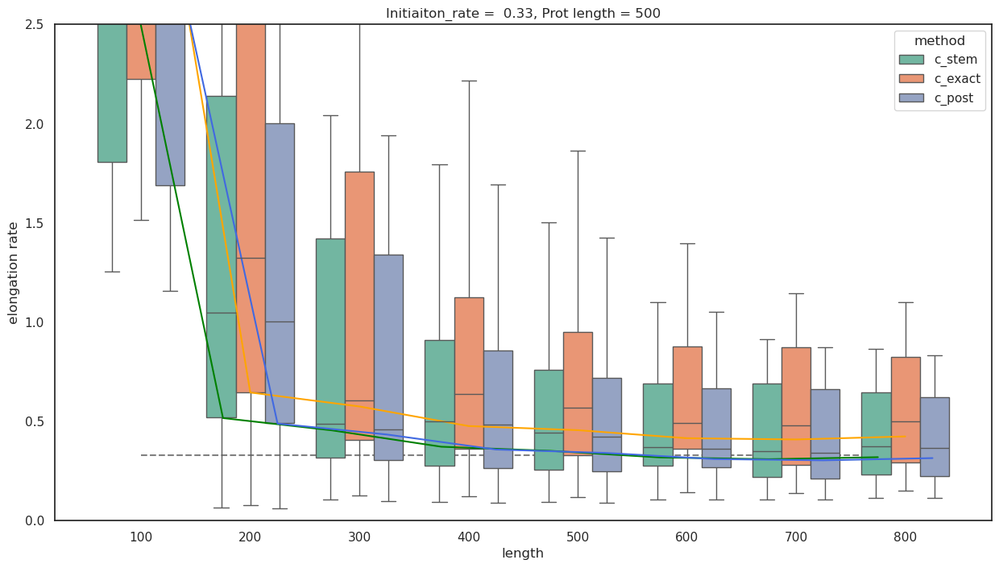

In [140]:
import seaborn as sns
import seaborn
seaborn.set_theme(style='white')

df = pd.melt(datas, id_vars=['length'], value_vars=[ "c_stem", "c_exact", "c_post",],
             var_name='method', value_name='elongation rate')

fig, ax = plt.subplots()
ax.hlines(binding_rate, 0,7, linestyles="dashed", color = "grey")
sns.boxplot(x="length", y="elongation rate", hue="method", data=df, palette="Set2", showfliers=False, ax=ax )

ax.plot(np.arange(0,8)-0.25, datas[datas["start"]==-10]["c_stem"], color = "green")
ax.plot(np.arange(0,8), datas[datas["start"]==-10]["c_exact"], color = "orange")
ax.plot(np.arange(0,8)+0.25, datas[datas["start"]==-10]["c_post"], color = "royalblue")

ax.set_title("Initiaiton_rate =  "+ str(binding_rate)+ ", Prot length = " + str(prot_length))
ax.set_ylim(0, 2.5)
fig.set_size_inches((15,8)) 

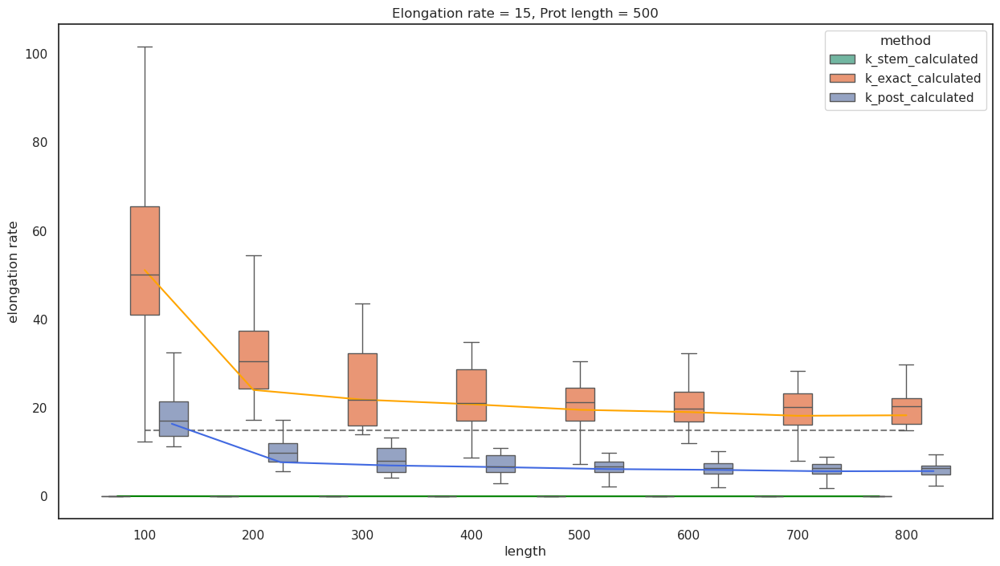

In [138]:
import seaborn as sns
import seaborn
seaborn.set_theme(style='white')

df = pd.melt(datas, id_vars=['length'], value_vars=[ "k_stem_calculated", "k_exact_calculated", "k_post_calculated",],
             var_name='method', value_name='elongation rate')

fig, ax = plt.subplots()
ax.hlines(translation_rate, 0,7, linestyles="dashed", color = "grey")
sns.boxplot(x="length", y="elongation rate", hue="method", data=df, palette="Set2", showfliers=False, ax=ax )

ax.plot(np.arange(0,8)-0.25, datas[datas["start"]==-10]["k_stem_calculated"], color = "green")
ax.plot(np.arange(0,8), datas[datas["start"]==-10]["k_exact_calculated"], color = "orange")
ax.plot(np.arange(0,8)+0.25, datas[datas["start"]==-10]["k_post_calculated"], color = "royalblue")

ax.set_title("Elongation rate = "+ str(translation_rate)+ ", Prot length = " + str(prot_length))

fig.set_size_inches((15,8)) 

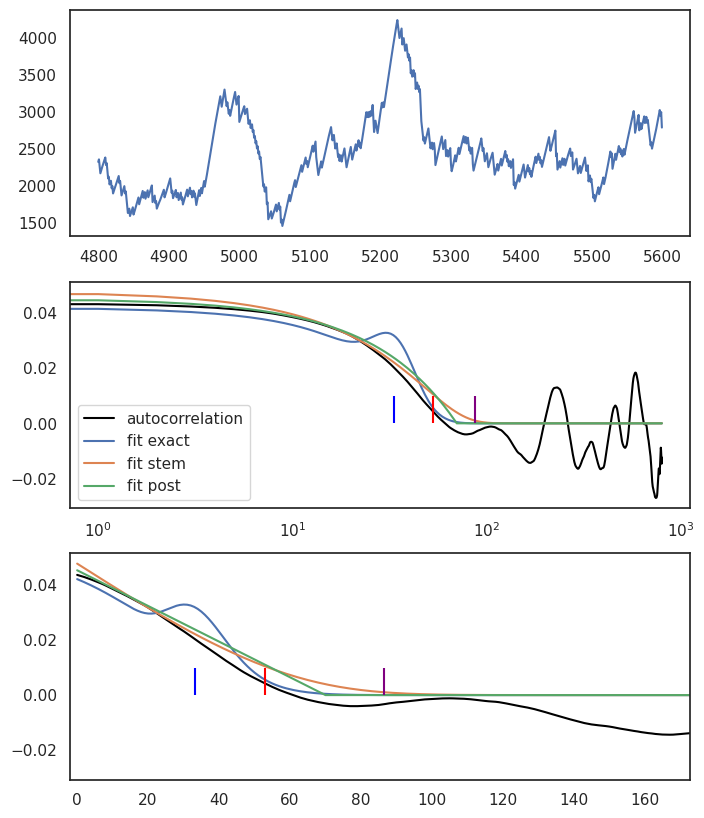

In [132]:
fig, axes = plt.subplots(nrows=3)

axes[0].plot(x_global[::step][min_i:max_i], 
         y_global[::step][min_i:max_i])

axes[1].plot(x_auto, y_auto, c="black", label="autocorrelation")
# axes[1].plot(x_auto, fit_function_stem_loop(x_auto, result.params["k"].value, result.params["c"].value, result.params["N"].value), label = "fit exact")
axes[1].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N,int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit exact")
axes[1].plot(x_auto, fit_function_stem_loop(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N,)[:int(len(x_auto))], label = "fit stem")
axes[1].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit post")

# axes[1].plot(x_auto, fit_function_exact_v3(x_auto, 24*translation_rate, 1/0.15, N, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "Exact")

axes[2].plot(x_auto, y_auto, c="black", label="autocorrelation")
# axes[2].plot(x_auto, fit_function_stem_loop(x_auto, result.params["k"].value, result.params["c"].value, result.params["N"].value), label = "fit exact")
axes[2].plot(x_auto, fit_function_exact_v3(x_auto, result_exact.params["k"].value, result_exact.params["c"].value, N, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit exact")
axes[2].plot(x_auto, fit_function_stem_loop(x_auto, result_stem.params["k"].value, result_stem.params["c"].value, N,)[:int(len(x_auto))], label = "fit stem")
axes[2].plot(x_auto, fit_function_post(x_auto, result_post.params["k"].value, result_post.params["c"].value, int(prot_length/(int(suntag_length/nb_suntag))))[:int(len(x_auto))], label = "fit post")


axes[1].vlines((suntag_length+prot_length)/translation_rate, 0,0.01,color='purple')
axes[1].vlines((suntag_length)/translation_rate, 0,0.01,color='red')
axes[1].vlines((prot_length)/translation_rate, 0,0.01, color='blue')
axes[2].vlines((suntag_length+prot_length)/translation_rate, 0,0.01, color="purple")
axes[2].vlines((suntag_length)/translation_rate, 0,0.01, color="red")
axes[2].vlines((prot_length)/translation_rate, 0,0.01, color="blue")

axes[2].set_xlim(-2, 2*(suntag_length+prot_length)/translation_rate,)

axes[1].set_xscale("log")
# ax.set_yscale("log")
axes[1].legend()
fig.set_size_inches((8,10))


In [792]:
(suntag_length+prot_length)/translation_rate, (suntag_length)/translation_rate, (prot_length)/translation_rate

(153.06666666666666, 53.06666666666667, 100.0)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


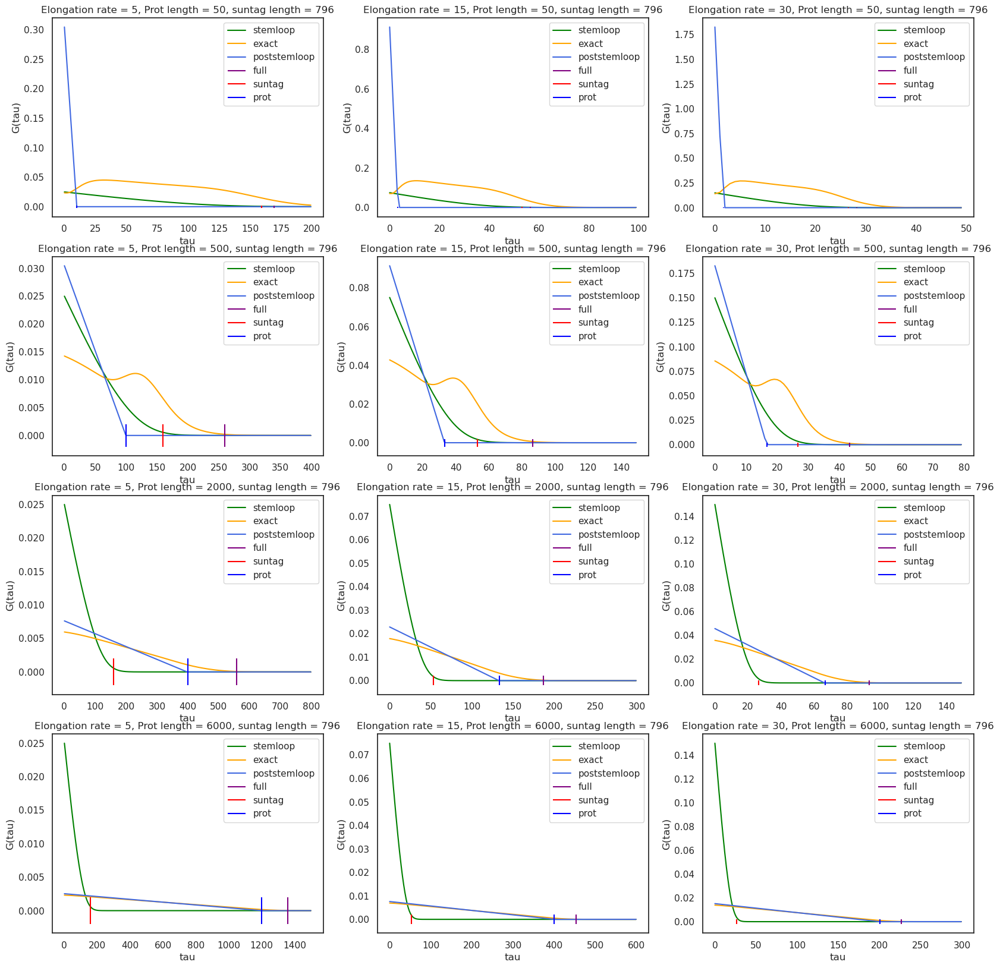

In [113]:
suntag_length = 796
prot_length =  500
nb_suntag = 32
fluo_one_suntag = 4
translation_rate = 5
binding_rate = 0.33
step = 0.1
length = 6000



fig, axes = plt.subplots(nrows=4, ncols=3)
i=0
j=0

for prot_length in [50, 500, 2000, 6000]:

    for translation_rate in [5,15,30]:
        if prot_length==50:
            if translation_rate==5:
                tau = np.arange(200)
            elif translation_rate==15:
                tau = np.arange(100)
            else:
                tau = np.arange(50)
        elif prot_length==500:
            if translation_rate==5:
                tau = np.arange(400)
            elif translation_rate==15:
                tau = np.arange(150)
            else:
                tau = np.arange(80)
        elif prot_length==2000:
            if translation_rate==5:
                tau = np.arange(800)
            elif translation_rate==15:
                tau = np.arange(300)
            else:
                tau = np.arange(150)
        else:
            if translation_rate==5:
                tau = np.arange(1500)
            elif translation_rate==15:
                tau = np.arange(600)
            else:
                tau = np.arange(300)
        
        N = nb_suntag
        M = int(prot_length/(suntag_length/nb_suntag))
        k = 1/((1/translation_rate)*(suntag_length/nb_suntag))
        c=binding_rate
        k = np.float128(k)
        c = np.float128(c)
        
        y = fit_function_exact(tau, k, c, N)
        axes[i,j].plot(tau, y, color = "green", label ="stemloop")
        
        y = fit_function_exact_v3(tau, k, c,N, M)
        axes[i,j].plot(tau, y, color = "orange", label ="exact")
        
        y = fit_function_post(tau, k, c, M)
        axes[i,j].plot(tau, y, color = "royalblue", label ="poststemloop")
        
        
        axes[i,j].vlines((suntag_length+prot_length)/translation_rate, -0.002, 0.002, color="purple", label="full")
        axes[i,j].vlines((suntag_length)/translation_rate, -0.002,0.002, color="red", label="suntag")
        axes[i,j].vlines((prot_length)/translation_rate, -0.002,0.002, color="blue", label="prot")
        
        axes[i,j].set_xlabel("tau")
        axes[i,j].set_ylabel("G(tau)")
        axes[i,j].legend()
        
        axes[i,j].set_title("Elongation rate = "+ str(translation_rate)+ ", Prot length = " + str(prot_length)+ ", suntag length = " + str(suntag_length))
        j+=1
    i+=1
    j=0
fig.set_size_inches(20,20)
fig.savefig("profile_comparison.png")
fig.savefig("profile_comparison.eps")

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


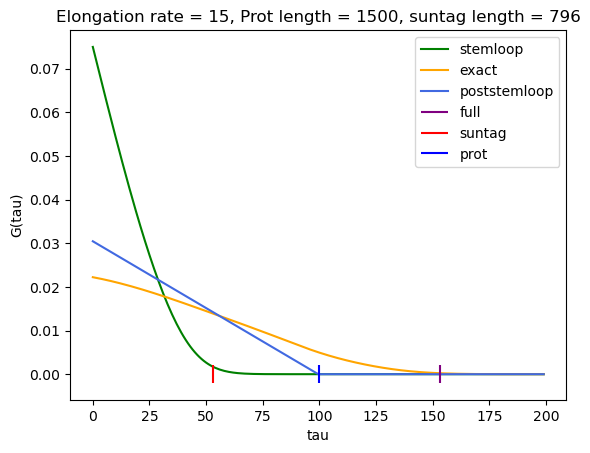

In [11]:
suntag_length = 796
prot_length =  500
nb_suntag = 32
fluo_one_suntag = 4
translation_rate = 5
binding_rate = 0.33
step = 0.1
length = 6000



fig, axes = plt.subplots(nrows=1, ncols=1)
i=0
j=0

prot_length=1500
translation_rate = 15


tau = np.arange(200)

N = nb_suntag
M = int(prot_length/(suntag_length/nb_suntag))
k = 1/((1/translation_rate)*(suntag_length/nb_suntag))
c=binding_rate
k = np.float128(k)
c = np.float128(c)

y = function_epitope(tau, k, c, N)
axes.plot(tau, y, color = "green", label ="stemloop")

y = function_exact(tau, k, c, N, M)
axes.plot(tau, y, color = "orange", label ="exact")

y = fit_function_post(tau, k, c, M)
axes.plot(tau, y, color = "royalblue", label ="poststemloop")


axes.vlines((suntag_length+prot_length)/translation_rate, -0.002, 0.002, color="purple", label="full")
axes.vlines((suntag_length)/translation_rate, -0.002,0.002, color="red", label="suntag")
axes.vlines((prot_length)/translation_rate, -0.002,0.002, color="blue", label="prot")

axes.set_xlabel("tau")
axes.set_ylabel("G(tau)")
axes.legend()

axes.set_title("Elongation rate = "+ str(translation_rate)+ ", Prot length = " + str(prot_length)+ ", suntag length = " + str(suntag_length))

# fig.set_size_inches(20,20)
fig.savefig("profile_comparison.png")
fig.savefig("profile_comparison.eps")